# 🚀 Image to Insight: Meme Analyzer Project

## Phase I: Experimental Development (This Notebook)

This notebook contains the **experimental code** used during the learning phase. It demonstrates:
- Basic image processing with Pillow
- OCR text extraction with EasyOCR  
- Sentiment analysis with TextBlob
- Visualization with Matplotlib

---

## 📊 Understanding Sentiment Analysis

### **What is Sentiment?**

Sentiment analysis determines the emotional tone of text using Natural Language Processing (NLP). Our system uses **TextBlob**, which analyzes word choice to calculate two key metrics:

### **1. Sentiment Polarity** (Range: -1.0 to +1.0)

This measures how **positive** or **negative** the text is:

| Score Range | Label | Emoji | Meaning | Example Words |
|-------------|-------|-------|---------|---------------|
| **+0.1 to +1.0** | POSITIVE | 😊 | Happy, uplifting | love, awesome, beautiful, great, happy |
| **-0.1 to +0.1** | NEUTRAL | 😐 | Factual, no emotion | the, is, cat, today, click |
| **-1.0 to -0.1** | NEGATIVE | 😔 | Sad, critical | hate, terrible, failure, bad, empty |

**How it works:**
- Each word has an emotional weight
- Positive words like "love" (+0.5) increase the score
- Negative words like "hate" (-0.8) decrease the score
- Neutral words like "cat" (0.0) don't affect the score

### **2. Subjectivity** (Range: 0.0 to 1.0)

This measures if the text is **opinion** or **fact**:

| Score Range | Type | Meaning |
|-------------|------|---------|
| **0.6 - 1.0** | Opinion/Humor | Personal feelings, jokes, rants |
| **0.3 - 0.6** | Mixed | Combination of fact and opinion |
| **0.0 - 0.3** | Factual | Objective information, statements |

---

## 🎯 Meme Purpose Classification

By combining **polarity** + **subjectivity**, we determine the meme's goal:

| Sentiment | Subjectivity | Meme Purpose |
|-----------|--------------|--------------|
| POSITIVE (>0.3) | High (>0.5) | 🎉 TO MAKE YOU SMILE (Wholesome/Funny) |
| NEGATIVE (<-0.3) | High (>0.5) | 😤 TO VENT/COMPLAIN (Relatable Frustration) |
| POSITIVE (>0) | Low (<0.3) | ✅ TO INFORM POSITIVELY (Motivational) |
| NEGATIVE (<0) | Low (<0.3) | ⚠️ TO WARN/CRITIQUE (Serious Message) |
| NEUTRAL (~0) | High (>0.5) | 🤔 TO MAKE YOU THINK (Thought-provoking) |
| NEUTRAL (~0) | Low (<0.3) | 📰 TO STATE FACTS (Informational) |
| Other | Other | 🎭 TO ENTERTAIN (General Humor) |

---

## 📋 Real Examples

| Text | Polarity | Sentiment | Purpose |
|------|----------|-----------|---------|
| "I love this meme!" | +0.5 | POSITIVE 😊 | TO MAKE YOU SMILE |
| "This is terrible and I hate it" | -0.8 | NEGATIVE 😔 | TO VENT/COMPLAIN |
| "The image shows a cat" | 0.0 | NEUTRAL 😐 | TO STATE FACTS |
| "brother may i have some loops" | 0.0 | NEUTRAL 😐 | TO ENTERTAIN |
| "empty existence full of failure" | -0.15 | NEGATIVE 😔 | TO VENT/COMPLAIN |

---

## Phase II: Production Implementation

The final production-ready code has been refactored into modular files. See `README.md` for full documentation.

### 🚀 To Run the Production App

```bash
streamlit run app.py
```

---

In [40]:
import easyocr
from textblob import TextBlob
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import BytesIO
import torch
import os

# Configuration
USE_GPU = torch.cuda.is_available()
print(f"✅ Libraries Imported.")
print(f"🚀 GPU Available: {USE_GPU} (If False, OCR will be slower but still work)")

✅ Libraries Imported.
🚀 GPU Available: False (If False, OCR will be slower but still work)


In [41]:
import json
import time

# =============================================================================
# METHOD 1: The "Wild" Way - Reddit JSON API (Best for Live Data)
# =============================================================================

def fetch_memes_from_reddit(subreddit='wholesomememes', limit=10):
    """
    Fetch memes directly from Reddit's JSON API
    No authentication needed! Just add .json to any Reddit URL
    """
    print(f"📡 Fetching from r/{subreddit} using Reddit JSON API...")
    
    # Reddit JSON endpoint
    url = f"https://www.reddit.com/r/{subreddit}/hot.json?limit={limit}"
    
    headers = {
        'User-Agent': 'MemeAnalyzer/1.0 (Educational Project)'
    }
    
    meme_paths = []
    
    try:
        response = requests.get(url, headers=headers, timeout=15)
        response.raise_for_status()
        data = response.json()
        
        posts = data['data']['children']
        print(f"   📊 Found {len(posts)} posts from Reddit")
        
        for post in posts:
            post_data = post['data']
            
            # Check if it's an image post
            if 'url' in post_data:
                url = post_data['url']
                title = post_data['title']
                
                # Only download direct image links
                if url.endswith(('.jpg', '.jpeg', '.png')):
                    try:
                        img_response = requests.get(url, timeout=10)
                        img_response.raise_for_status()
                        
                        img = Image.open(BytesIO(img_response.content))
                        
                        # Convert to RGB
                        if img.mode != 'RGB':
                            if img.mode in ('RGBA', 'P', 'LA'):
                                background = Image.new('RGB', img.size, (255, 255, 255))
                                if img.mode == 'P':
                                    img = img.convert('RGBA')
                                if 'A' in img.mode:
                                    background.paste(img, mask=img.split()[-1])
                                    img = background
                                else:
                                    img = img.convert('RGB')
                            else:
                                img = img.convert('RGB')
                        
                        # Save with sanitized filename
                        filename = f"reddit_{subreddit}_{post_data['id']}.jpg"
                        filepath = f"test_memes/{filename}"
                        
                        if not os.path.exists("test_memes"):
                            os.makedirs("test_memes")
                        
                        img.save(filepath, "JPEG", quality=95)
                        meme_paths.append(filepath)
                        print(f"   ✅ Downloaded: {title[:50]}... ({img.size[0]}x{img.size[1]})")
                        
                    except Exception as e:
                        print(f"   ⚠️ Failed to download image: {type(e).__name__}")
        
        # Be nice to Reddit's servers
        time.sleep(1)
        
    except Exception as e:
        print(f"   ❌ Reddit API Error: {e}")
    
    return meme_paths

# =============================================================================
# METHOD 2: The "Stable" Way - Meme-API.com (Curated Reddit Scraper)
# =============================================================================

def fetch_memes_from_api(count=10):
    """
    Use meme-api.com - a free API that scrapes Reddit and returns clean meme data
    """
    print(f"🎯 Fetching from Meme-API.com (curated memes)...")
    
    meme_paths = []
    
    # Meme API gives you one random meme per request
    for i in range(count):
        try:
            response = requests.get("https://meme-api.com/gimme", timeout=10)
            response.raise_for_status()
            data = response.json()
            
            # Extract image URL
            if 'url' in data:
                url = data['url']
                title = data.get('title', 'Untitled')
                subreddit = data.get('subreddit', 'unknown')
                
                # Download image
                img_response = requests.get(url, timeout=10)
                img_response.raise_for_status()
                
                img = Image.open(BytesIO(img_response.content))
                
                # Convert to RGB
                if img.mode != 'RGB':
                    if img.mode in ('RGBA', 'P', 'LA'):
                        background = Image.new('RGB', img.size, (255, 255, 255))
                        if img.mode == 'P':
                            img = img.convert('RGBA')
                        if 'A' in img.mode:
                            background.paste(img, mask=img.split()[-1])
                            img = background
                        else:
                            img = img.convert('RGB')
                    else:
                        img = img.convert('RGB')
                
                # Save
                filename = f"api_{subreddit}_{i+1}.jpg"
                filepath = f"test_memes/{filename}"
                
                if not os.path.exists("test_memes"):
                    os.makedirs("test_memes")
                
                img.save(filepath, "JPEG", quality=95)
                meme_paths.append(filepath)
                print(f"   ✅ Downloaded: {title[:50]}... from r/{subreddit}")
                
                # Be nice to the API
                time.sleep(0.5)
                
        except Exception as e:
            print(f"   ⚠️ API request {i+1} failed: {type(e).__name__}")
    
    return meme_paths

# =============================================================================
# METHOD 3: The "Lazy" Way - Pre-tested Stable URLs
# =============================================================================

def fetch_classic_memes():
    """
    Download well-known memes from stable sources (Know Your Meme, etc.)
    """
    print(f"🗂️ Downloading classic memes from stable sources...")
    
    # Curated list of memes that definitely have text
    classic_memes = [
        ("https://i.kym-cdn.com/photos/images/newsfeed/001/393/656/da7.jpg", "brother_loops.jpg"),
        ("https://i.kym-cdn.com/photos/images/newsfeed/001/431/201/40f.png", "surprised_pikachu.png"),
        ("https://i.kym-cdn.com/photos/images/newsfeed/002/086/808/90f.jpg", "woman_yelling_cat.jpg"),
        ("https://i.kym-cdn.com/entries/icons/original/000/030/710/dd0.png", "disaster_girl.png"),
    ]
    
    meme_paths = []
    
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36'
    }
    
    for url, filename in classic_memes:
        try:
            response = requests.get(url, timeout=15, headers=headers)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))
            
            # Convert to RGB
            if img.mode != 'RGB':
                if img.mode in ('RGBA', 'P', 'LA'):
                    background = Image.new('RGB', img.size, (255, 255, 255))
                    if img.mode == 'P':
                        img = img.convert('RGBA')
                    if 'A' in img.mode:
                        background.paste(img, mask=img.split()[-1])
                        img = background
                    else:
                        img = img.convert('RGB')
                else:
                    img = img.convert('RGB')
            
            filepath = f"test_memes/{filename.replace('.png', '.jpg')}"
            
            if not os.path.exists("test_memes"):
                os.makedirs("test_memes")
            
            img.save(filepath, "JPEG", quality=95)
            meme_paths.append(filepath)
            print(f"   ✅ Downloaded: {filename} ({img.size[0]}x{img.size[1]})")
            
        except Exception as e:
            print(f"   ⚠️ Skipped: {filename} - {type(e).__name__}")
    
    return meme_paths

# =============================================================================
# MAIN: Try All Methods
# =============================================================================

print("🚀 Starting Meme Collection using 3 different methods!\n")

all_meme_paths = []

# Method 1: Reddit JSON API (try multiple subreddits)
print("\n" + "="*70)
print("METHOD 1: Reddit JSON API (Live Data)")
print("="*70)
for subreddit in ['memes', 'wholesomememes', 'ProgrammerHumor']:
    paths = fetch_memes_from_reddit(subreddit=subreddit, limit=5)
    all_meme_paths.extend(paths)
    time.sleep(2)  # Be respectful to Reddit

# Method 2: Meme API
print("\n" + "="*70)
print("METHOD 2: Meme-API.com (Curated)")
print("="*70)
api_paths = fetch_memes_from_api(count=5)
all_meme_paths.extend(api_paths)

# Method 3: Classic Memes
print("\n" + "="*70)
print("METHOD 3: Classic Stable Memes")
print("="*70)
classic_paths = fetch_classic_memes()
all_meme_paths.extend(classic_paths)

# Remove duplicates
image_paths = list(set(all_meme_paths))

print("\n" + "="*70)
print(f"✅ TOTAL: Successfully collected {len(image_paths)} unique memes!")
print("="*70)

# Show what we have
print("\n📋 Meme Collection Summary:")
for i, path in enumerate(image_paths, 1):
    if os.path.exists(path):
        img = Image.open(path)
        print(f"   {i}. {os.path.basename(path)} - {img.size[0]}x{img.size[1]}px")


🚀 Starting Meme Collection using 3 different methods!


METHOD 1: Reddit JSON API (Live Data)
📡 Fetching from r/memes using Reddit JSON API...
   📊 Found 5 posts from Reddit
   📊 Found 5 posts from Reddit
   ✅ Downloaded: Shit happens... (1863x1920)
   ✅ Downloaded: Shit happens... (1863x1920)
   ✅ Downloaded: Adulthood sucks... (720x582)
   ✅ Downloaded: No mom. I JUST WANT TO FORGET THAT IM HERE AGAIN F... (1200x1224)
   ✅ Downloaded: Google in a nutshell... (1047x1080)
📡 Fetching from r/wholesomememes using Reddit JSON API...
   📊 Found 5 posts from Reddit
   ✅ Downloaded: What's a beautiful tree without a pizza ornament?... (1008x1041)
   ✅ Downloaded: Seriously, you guys are wonderful!... (1200x750)
   ✅ Downloaded: Everyone deserves a nice word... (600x600)
   ✅ Downloaded: Real Love: Growing Together, Not Perfecting Each O... (960x902)
   ✅ Downloaded: Healing Vegeta [OC]... (2160x2700)
📡 Fetching from r/ProgrammerHumor using Reddit JSON API...
   📊 Found 5 posts from Reddit
   

In [42]:
class MemeAnalyzer:
    def __init__(self):
        print("⏳ Loading EasyOCR Model... (This may take a moment)")
        # Initialize the reader once to avoid reloading it for every image
        self.reader = easyocr.Reader(['en'], gpu=USE_GPU)
        print("✅ Model Loaded!")

    def preprocess_image(self, img):
        """
        Preprocess image for better OCR accuracy
        - Resize if too small
        - Enhance contrast
        """
        from PIL import ImageEnhance, ImageFilter
        
        # Resize small images (OCR works better on larger images)
        width, height = img.size
        min_dimension = 800
        if width < min_dimension or height < min_dimension:
            scale = max(min_dimension / width, min_dimension / height)
            new_size = (int(width * scale), int(height * scale))
            img = img.resize(new_size, Image.LANCZOS)
        
        # Enhance contrast slightly
        enhancer = ImageEnhance.Contrast(img)
        img = enhancer.enhance(1.2)
        
        # Sharpen the image
        img = img.filter(ImageFilter.SHARPEN)
        
        return img

    def analyze_image(self, image_path):
        """
        Input: Path to an image
        Output: Dictionary containing text, sentiment, and confidence
        """
        try:
            # 1. Load Image
            original_img = Image.open(image_path)
            
            # 2. Preprocess for better OCR
            processed_img = self.preprocess_image(original_img.copy())
            
            # Convert to RGB and NumPy array for EasyOCR
            img_array = np.array(processed_img.convert('RGB'))

            # 3. Extract Text (OCR) with optimized parameters
            results = self.reader.readtext(
                img_array, 
                detail=1,
                paragraph=False,       # Keep text separate for better detection
                text_threshold=0.3,    # Lower threshold
                low_text=0.2,          # Catch more text
            )

            # 4. Process Results
            detected_text = []
            total_confidence = 0
            valid_count = 0
            
            if not results:
                return {
                    "image": original_img,
                    "status": "No Text Found",
                    "text": "",
                    "sentiment": 0.0,
                    "subjectivity": 0.0,
                    "confidence": 0.0
                }

            for item in results:
                # EasyOCR returns: (bbox, text, confidence)
                if len(item) >= 3:
                    bbox = item[0]
                    text = item[1]
                    prob = item[2]
                elif len(item) == 2:
                    text = item[0]
                    prob = item[1]
                else:
                    continue
                
                # Accept text with reasonable confidence
                if prob > 0.1 and len(str(text).strip()) > 0:
                    detected_text.append(str(text))
                    total_confidence += prob
                    valid_count += 1

            full_text = " ".join(detected_text)
            avg_confidence = total_confidence / valid_count if valid_count > 0 else 0

            if not full_text.strip():
                return {
                    "image": original_img,
                    "status": "No Valid Text",
                    "text": "",
                    "sentiment": 0.0,
                    "subjectivity": 0.0,
                    "confidence": 0.0
                }

            # 5. Sentiment Analysis (NLP)
            blob = TextBlob(full_text)
            
            polarity = blob.sentiment.polarity       # -1.0 (Negative) to +1.0 (Positive)
            subjectivity = blob.sentiment.subjectivity # 0.0 (Fact) to 1.0 (Opinion)

            return {
                "image": original_img,
                "status": "Success",
                "text": full_text,
                "sentiment": polarity,
                "subjectivity": subjectivity,
                "confidence": avg_confidence
            }
            
        except Exception as e:
            print(f"❌ Error processing {image_path}: {e}")
            return None

# Reinstantiate the analyzer
analyzer = MemeAnalyzer()


Using CPU. Note: This module is much faster with a GPU.


⏳ Loading EasyOCR Model... (This may take a moment)
✅ Model Loaded!
✅ Model Loaded!


🔍 Analyzing 22 memes...

📷 Processing: reddit_ProgrammerHumor_1pj5nsk.jpg


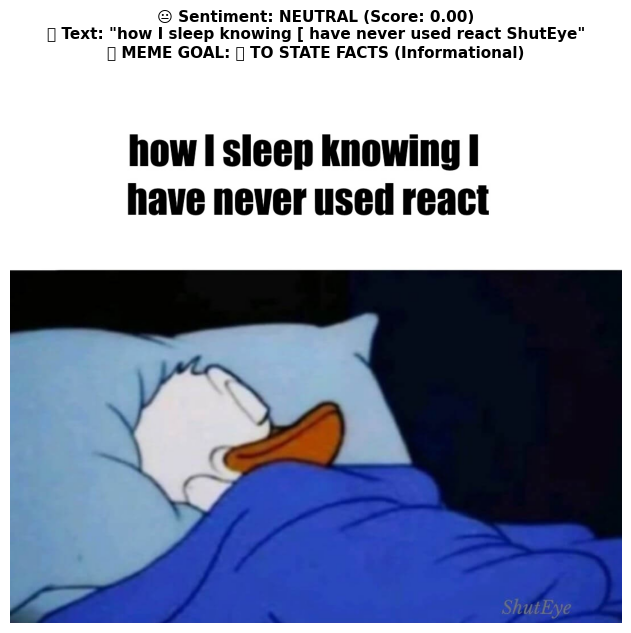

📊 ANALYSIS RESULTS
📝 Text: "how I sleep knowing [ have never used react ShutEye"
🤖 OCR Confidence: 81.4%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: reddit_memes_1pj5umn.jpg


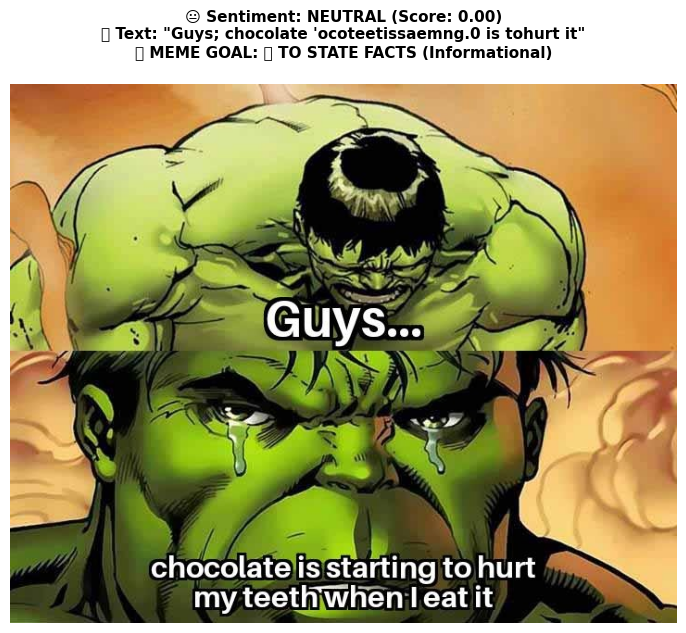

📊 ANALYSIS RESULTS
📝 Text: "Guys; chocolate 'ocoteetissaemng.0 is tohurt it"
🤖 OCR Confidence: 70.8%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: reddit_ProgrammerHumor_1pj6v7d.jpg


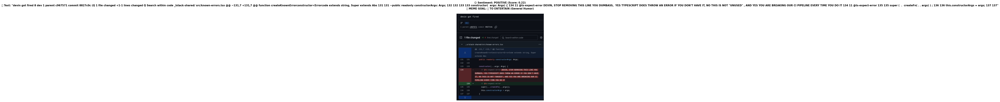

📊 ANALYSIS RESULTS
📝 Text: "devin got fired 8 dev 1 parent c967571 commit 8827c0c (Q 1 file changed +1-1 lines changed Q Search within code _lstack-shared/ src/known-errors.tsx @@ ~131,7 +131,7 @@ function createKnownErrorconstructor<Errorcode extends string, Super extends Abs 131 131 ~public readonly constructorArgs: Args; 132 132 133 133 constructor(  args: Args) { 134 11 @ts-expect-error DEVIN, STOP REMOVING THIS LINE YOU DUMBASS,  YES TYPESCRIPT DOES THROW AN ERROR IF YOU DON'T HAVE IT, NO THIS IS NOT "UNUSED" , AND YES YOU ARE BREAKING OUR CI PIPELINE EVERY TIME YOU DO IT 134 11 @ts-expect-error 135 135 super (  .  createFn( . . args) ) ; 136 136 this.constructorArgs = args; 137 137"
🤖 OCR Confidence: 82.0%
💭 Sentiment: POSITIVE 😊 (Score: 0.222)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)

📷 Processing: api_me_irl_4.jpg


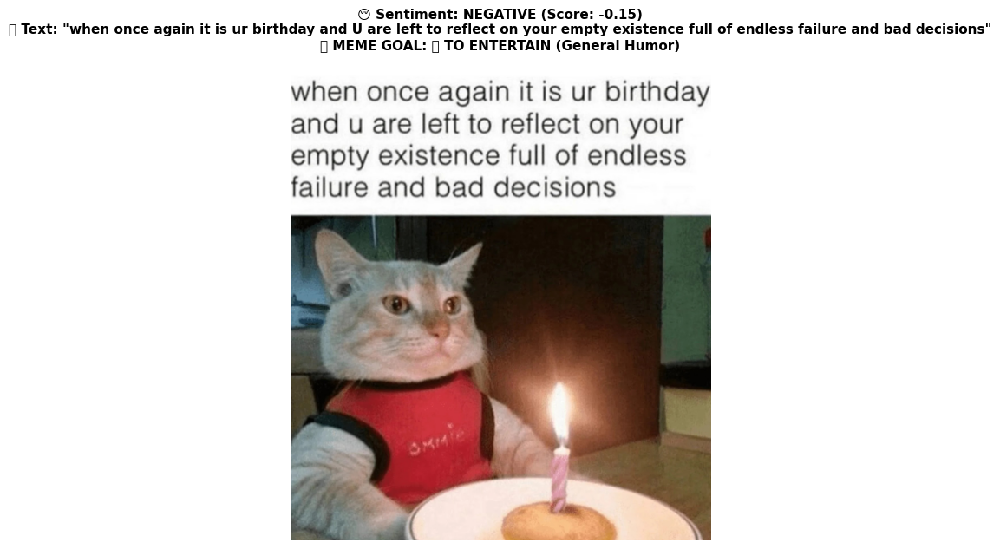

📊 ANALYSIS RESULTS
📝 Text: "when once again it is ur birthday and U are left to reflect on your empty existence full of endless failure and bad decisions"
🤖 OCR Confidence: 76.9%
💭 Sentiment: NEGATIVE 😔 (Score: -0.149)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)

📷 Processing: brother_loops.jpg


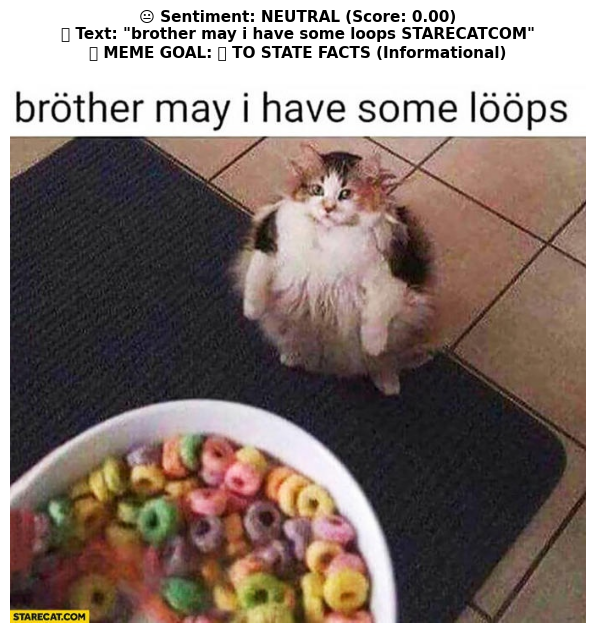

📊 ANALYSIS RESULTS
📝 Text: "brother may i have some loops STARECATCOM"
🤖 OCR Confidence: 98.8%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: reddit_wholesomememes_1pi4xda.jpg


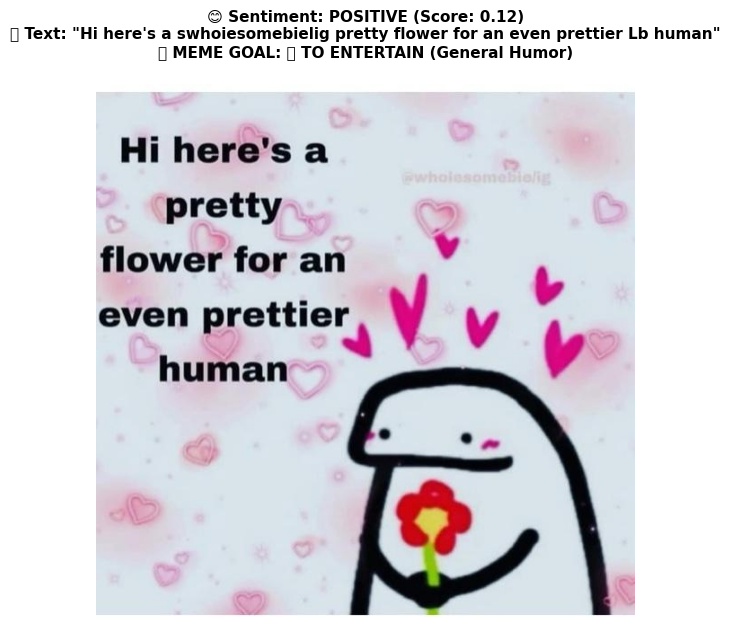

📊 ANALYSIS RESULTS
📝 Text: "Hi here's a swhoiesomebielig pretty flower for an even prettier Lb human"
🤖 OCR Confidence: 85.0%
💭 Sentiment: POSITIVE 😊 (Score: 0.125)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)

📷 Processing: reddit_wholesomememes_1pidhju.jpg


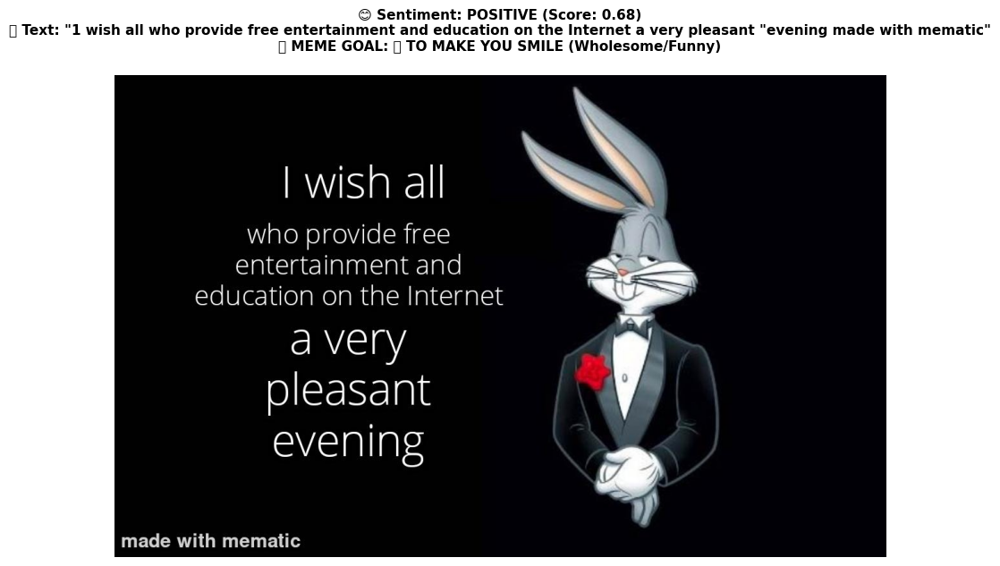

📊 ANALYSIS RESULTS
📝 Text: "1 wish all who provide free entertainment and education on the Internet a very pleasant "evening made with mematic"
🤖 OCR Confidence: 81.8%
💭 Sentiment: POSITIVE 😊 (Score: 0.677)
🎯 PURPOSE: 🎉 TO MAKE YOU SMILE (Wholesome/Funny)
💡 INSIGHT: Wholesome/uplifting content

📷 Processing: reddit_memes_1pjpfo3.jpg


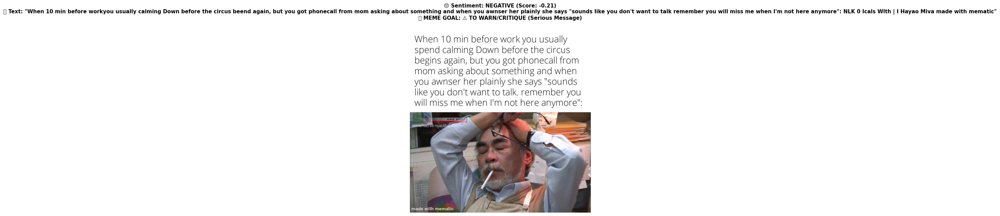

📊 ANALYSIS RESULTS
📝 Text: "When 10 min before workyou usually calming Down before the circus beend again, but you got phonecall from mom asking about something and when you awnser her plainly she says "sounds Iike you don't want to talk remember you will miss me when I'm not here anymore": NLK 0 Icals Wlth | I Hayao Miva made with mematic"
🤖 OCR Confidence: 69.4%
💭 Sentiment: NEGATIVE 😔 (Score: -0.207)
🎯 PURPOSE: ⚠️ TO WARN/CRITIQUE (Serious Message)

📷 Processing: reddit_ProgrammerHumor_1pj5pn8.jpg


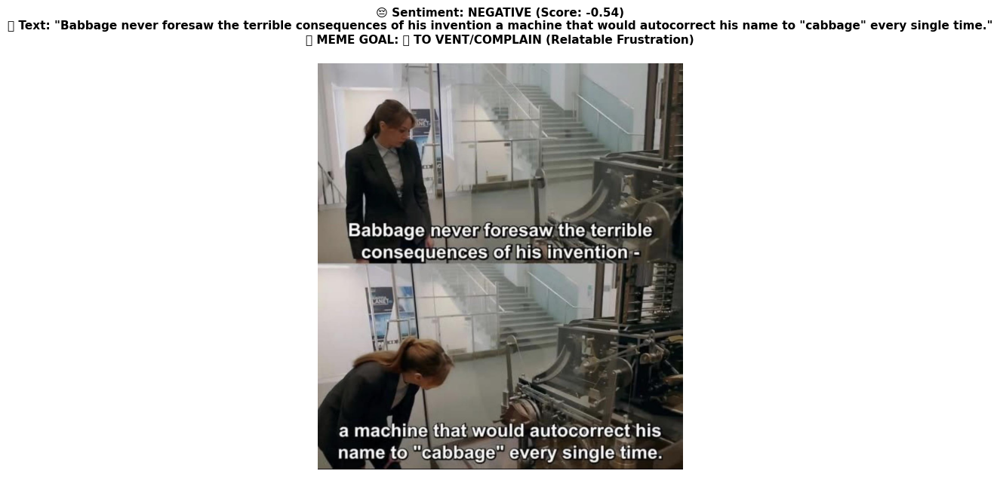

📊 ANALYSIS RESULTS
📝 Text: "Babbage never foresaw the terrible consequences of his invention a machine that would autocorrect his name to "cabbage" every single time."
🤖 OCR Confidence: 87.4%
💭 Sentiment: NEGATIVE 😔 (Score: -0.536)
🎯 PURPOSE: 😤 TO VENT/COMPLAIN (Relatable Frustration)

📷 Processing: api_me_irl_1.jpg


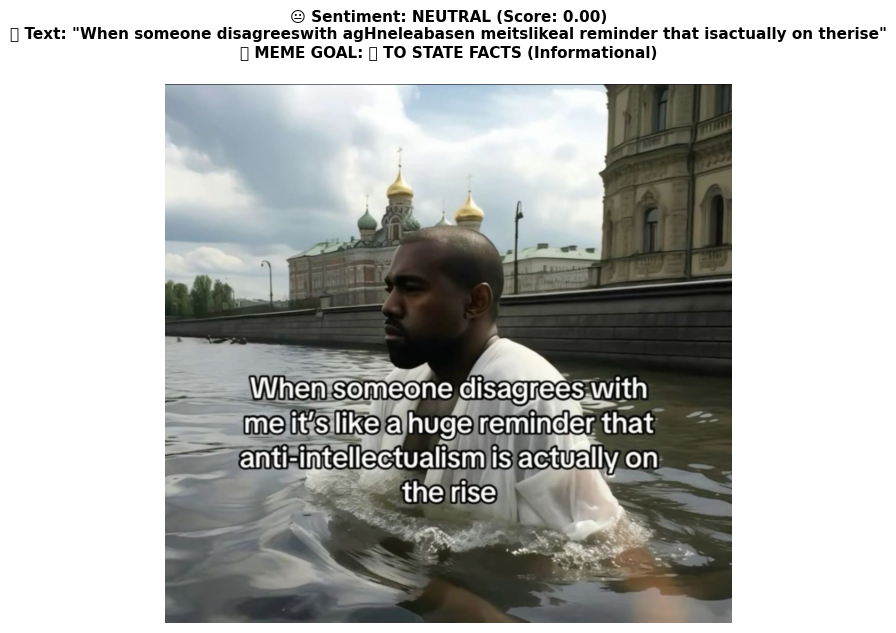

📊 ANALYSIS RESULTS
📝 Text: "When someone disagreeswith agHneleabasen meitslikeal reminder that isactually on therise"
🤖 OCR Confidence: 66.4%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: api_memes_2.jpg


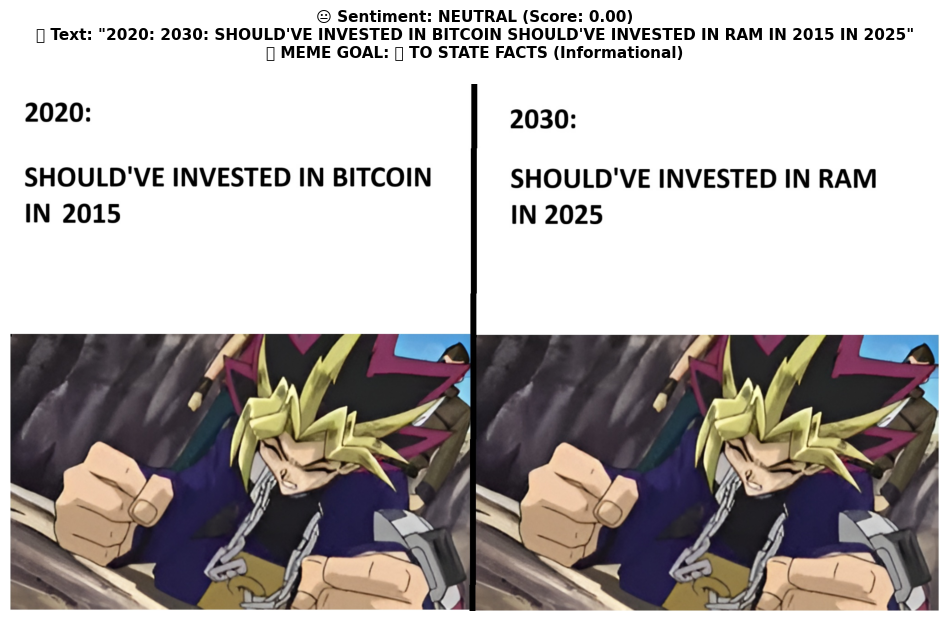

📊 ANALYSIS RESULTS
📝 Text: "2020: 2030: SHOULD'VE INVESTED IN BITCOIN SHOULD'VE INVESTED IN RAM IN 2015 IN 2025"
🤖 OCR Confidence: 98.5%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: api_me_irl_3.jpg


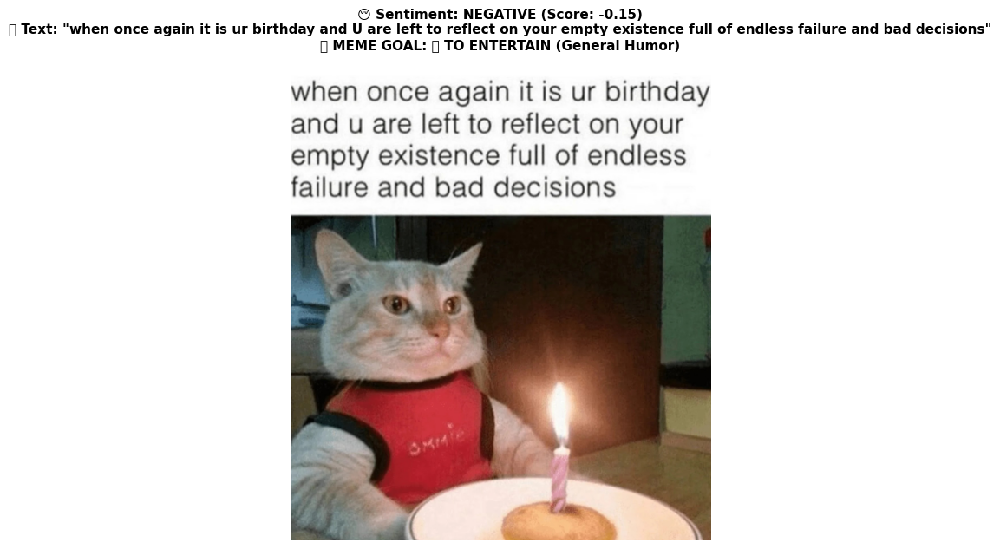

📊 ANALYSIS RESULTS
📝 Text: "when once again it is ur birthday and U are left to reflect on your empty existence full of endless failure and bad decisions"
🤖 OCR Confidence: 76.9%
💭 Sentiment: NEGATIVE 😔 (Score: -0.149)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)

📷 Processing: reddit_wholesomememes_1pgwoso.jpg


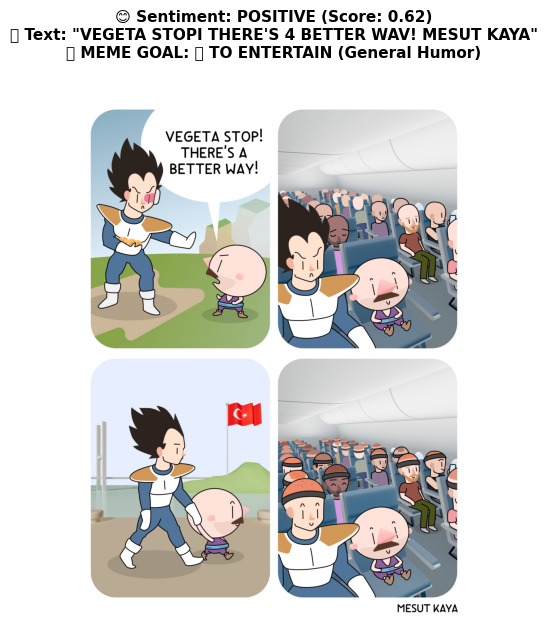

📊 ANALYSIS RESULTS
📝 Text: "VEGETA STOPI THERE'S 4 BETTER WAV! MESUT KAYA"
🤖 OCR Confidence: 87.2%
💭 Sentiment: POSITIVE 😊 (Score: 0.625)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)
💡 INSIGHT: Wholesome/uplifting content

📷 Processing: disaster_girl.jpg
⚠️ Skipped: No readable text found

📷 Processing: reddit_ProgrammerHumor_1pjpbmq.jpg
⚠️ Skipped: No readable text found

📷 Processing: reddit_ProgrammerHumor_1pjpbmq.jpg


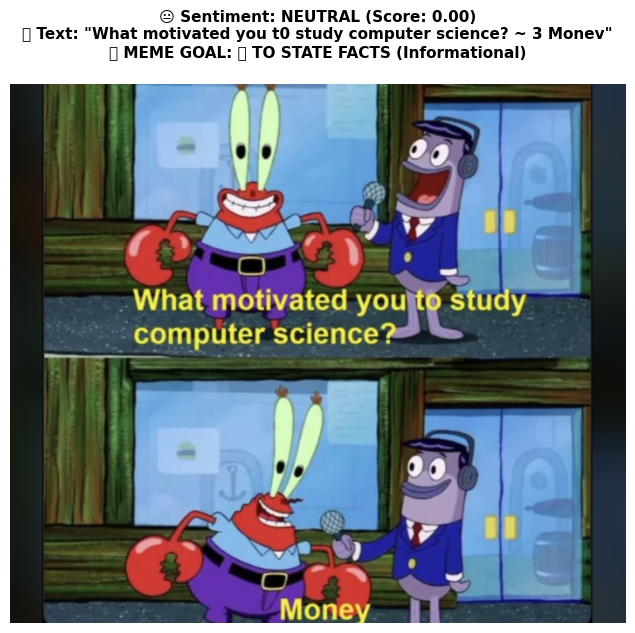

📊 ANALYSIS RESULTS
📝 Text: "What motivated you t0 study computer science? ~ 3 Monev"
🤖 OCR Confidence: 70.5%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: reddit_ProgrammerHumor_1pjbfm1.jpg


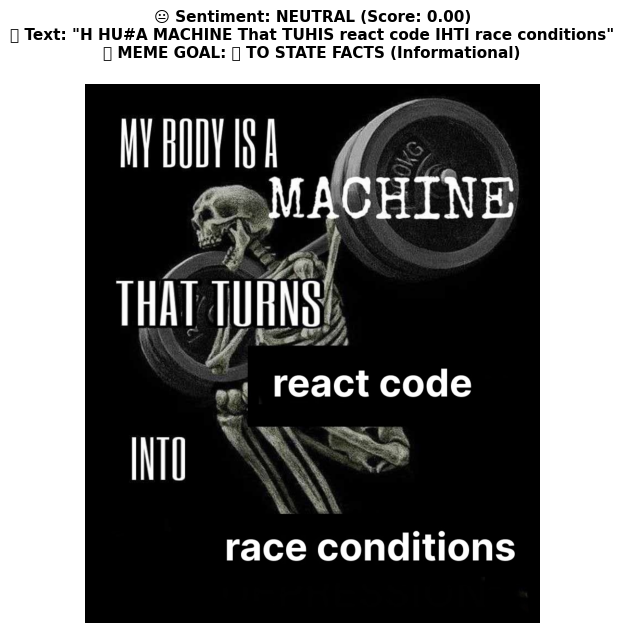

📊 ANALYSIS RESULTS
📝 Text: "H HU#A MACHINE That TUHIS react code IHTI race conditions"
🤖 OCR Confidence: 55.2%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: reddit_wholesomememes_1phx7ei.jpg


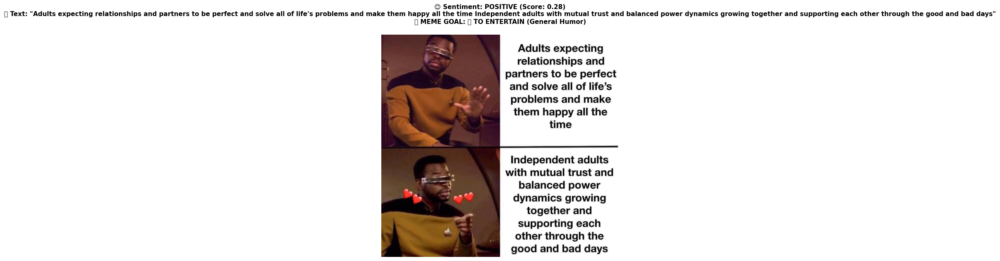

📊 ANALYSIS RESULTS
📝 Text: "Adults expecting relationships and partners to be perfect and solve all of life's problems and make them happy all the time Independent adults with mutual trust and balanced power dynamics growing together and supporting each other through the good and bad days"
🤖 OCR Confidence: 92.2%
💭 Sentiment: POSITIVE 😊 (Score: 0.275)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)

📷 Processing: surprised_pikachu.jpg


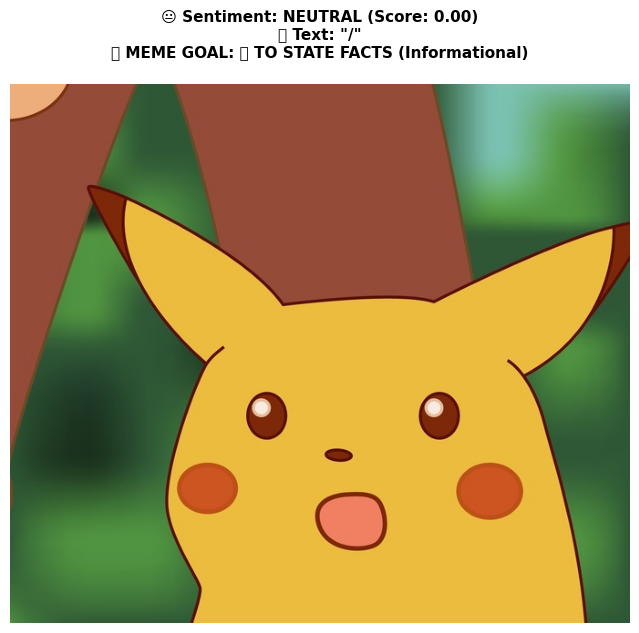

📊 ANALYSIS RESULTS
📝 Text: "/"
🤖 OCR Confidence: 11.9%
💭 Sentiment: NEUTRAL 😐 (Score: 0.000)
🎯 PURPOSE: 📰 TO STATE FACTS (Informational)

📷 Processing: reddit_memes_1pjbkrx.jpg


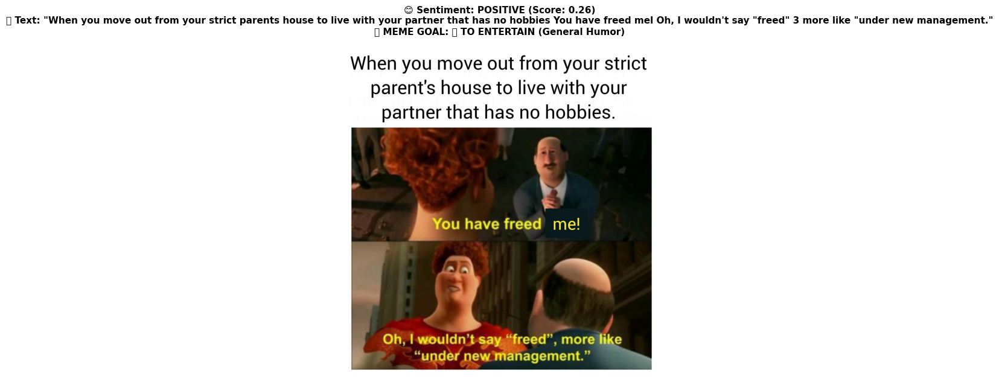

📊 ANALYSIS RESULTS
📝 Text: "When you move out from your strict parents house to live with your partner that has no hobbies You have freed mel Oh, I wouldn't say "freed" 3 more like "under new management."
🤖 OCR Confidence: 81.6%
💭 Sentiment: POSITIVE 😊 (Score: 0.258)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)

📷 Processing: reddit_wholesomememes_1piuwwc.jpg


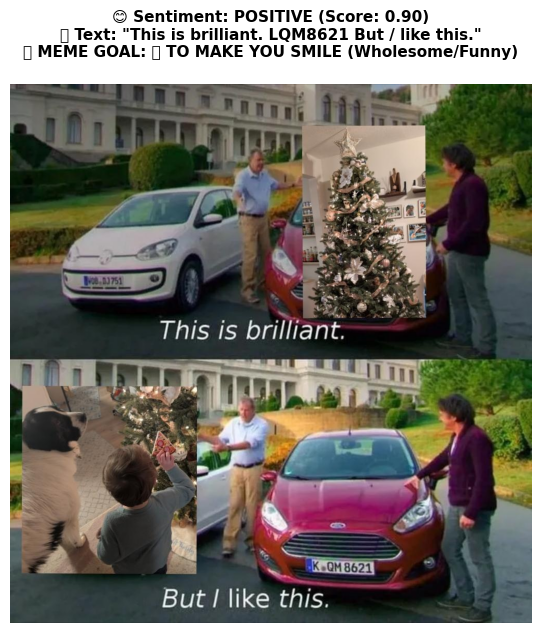

📊 ANALYSIS RESULTS
📝 Text: "This is brilliant. LQM8621 But / like this."
🤖 OCR Confidence: 50.9%
💭 Sentiment: POSITIVE 😊 (Score: 0.900)
🎯 PURPOSE: 🎉 TO MAKE YOU SMILE (Wholesome/Funny)
💡 INSIGHT: Wholesome/uplifting content

📷 Processing: reddit_memes_1pj34jh.jpg


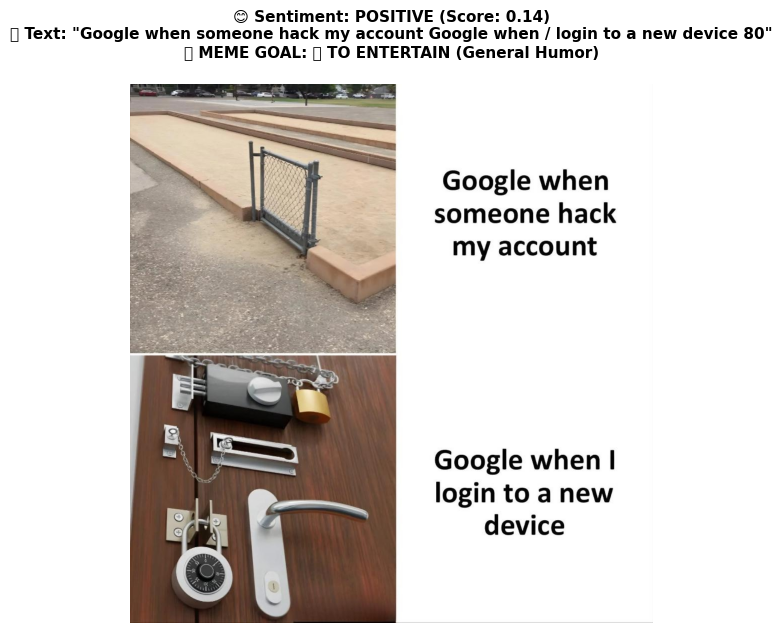

📊 ANALYSIS RESULTS
📝 Text: "Google when someone hack my account Google when / login to a new device 80"
🤖 OCR Confidence: 87.1%
💭 Sentiment: POSITIVE 😊 (Score: 0.136)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)

📷 Processing: api_dankmemes_5.jpg


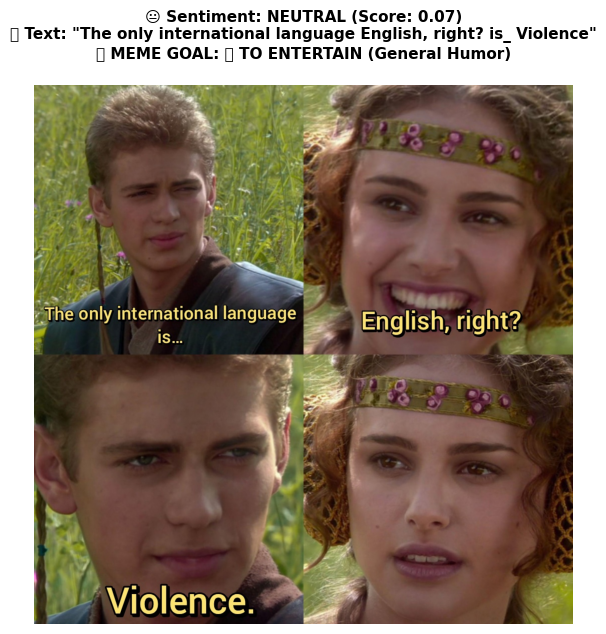

📊 ANALYSIS RESULTS
📝 Text: "The only international language English, right? is_ Violence"
🤖 OCR Confidence: 90.7%
💭 Sentiment: NEUTRAL 😐 (Score: 0.071)
🎯 PURPOSE: 🎭 TO ENTERTAIN (General Humor)


✅ Analysis Complete!
   • Successfully analyzed: 21 memes
   • Skipped (no text): 1 memes


In [43]:
def visualize_results(results):
    """
    Helper function to display image and metrics using Matplotlib
    """
    if not results:
        return
    
    # Skip images with no text detected
    if results['status'] != 'Success' or not results['text'].strip():
        print(f"⚠️ Skipped: No text found in image\n")
        return

    # Create a figure
    plt.figure(figsize=(12, 7))
    
    # Show Image
    plt.imshow(results['image'])
    plt.axis('off') # Hide axes
    
    # Determine Sentiment Color and Goal
    polarity = results['sentiment']
    subjectivity = results['subjectivity']
    
    # Enhanced sentiment interpretation
    if polarity > 0.1:
        color = 'green'
        label = "POSITIVE"
        emoji = "😊"
    elif polarity < -0.1:
        color = 'red'
        label = "NEGATIVE"
        emoji = "😔"
    else:
        color = 'gray'
        label = "NEUTRAL"
        emoji = "😐"
    
    # Determine meme goal/purpose
    if subjectivity > 0.6:
        purpose = "Opinion/Humor"
    elif subjectivity > 0.3:
        purpose = "Mixed (Fact + Opinion)"
    else:
        purpose = "Informational/Factual"
    
    # Determine meme type based on sentiment + subjectivity
    if polarity > 0.3 and subjectivity > 0.5:
        meme_goal = "🎉 TO MAKE YOU SMILE (Wholesome/Funny)"
    elif polarity < -0.3 and subjectivity > 0.5:
        meme_goal = "😤 TO VENT/COMPLAIN (Relatable Frustration)"
    elif polarity > 0 and subjectivity < 0.3:
        meme_goal = "✅ TO INFORM POSITIVELY (Motivational)"
    elif polarity < 0 and subjectivity < 0.3:
        meme_goal = "⚠️ TO WARN/CRITIQUE (Serious Message)"
    elif abs(polarity) < 0.1 and subjectivity > 0.5:
        meme_goal = "🤔 TO MAKE YOU THINK (Thought-provoking)"
    elif abs(polarity) < 0.1 and subjectivity < 0.3:
        meme_goal = "📰 TO STATE FACTS (Informational)"
    else:
        meme_goal = "🎭 TO ENTERTAIN (General Humor)"

    # Create Title String
    title_text = (
        f"{emoji} Sentiment: {label} (Score: {polarity:.2f})\n"
        f"📝 Text: \"{results['text']}\"\n"
        f"🎯 MEME GOAL: {meme_goal}"
    )
    
    plt.title(title_text, fontsize=11, color='black', fontweight='bold', pad=20)
    plt.show()
    
    # Print clean analysis
    print(f"{'='*70}")
    print(f"📊 ANALYSIS RESULTS")
    print(f"{'='*70}")
    print(f"📝 Text: \"{results['text']}\"")
    print(f"🤖 OCR Confidence: {results['confidence']*100:.1f}%")
    print(f"💭 Sentiment: {label} {emoji} (Score: {polarity:.3f})")
    print(f"🎯 PURPOSE: {meme_goal}")
    
    # Additional insights
    if polarity > 0 and "disaster" in results['text'].lower():
        print(f"💡 INSIGHT: Possible sarcasm detected!")
    elif polarity < 0 and subjectivity > 0.7:
        print(f"💡 INSIGHT: Relatable complaint/rant meme")
    elif polarity > 0.5:
        print(f"💡 INSIGHT: Wholesome/uplifting content")
    
    print(f"{'='*70}\n")

# --- MAIN LOOP ---
print(f"🔍 Analyzing {len(image_paths)} memes...\n")

successful_analysis = 0
skipped_images = 0

for img_path in image_paths:
    print(f"📷 Processing: {os.path.basename(img_path)}")
    result_data = analyzer.analyze_image(img_path)
    
    if result_data and result_data['status'] == 'Success':
        successful_analysis += 1
        visualize_results(result_data)
    else:
        skipped_images += 1
        print(f"⚠️ Skipped: No readable text found\n")

print(f"\n✅ Analysis Complete!")
print(f"   • Successfully analyzed: {successful_analysis} memes")
print(f"   • Skipped (no text): {skipped_images} memes")


In [44]:
# Let's use Quickmeme/Meme Generator direct links which tend to be more stable
# And also use the Loops cat meme which we successfully downloaded

# First, let's check what we actually downloaded
print("📋 Checking downloaded images:")
for path in image_paths:
    if os.path.exists(path):
        img = Image.open(path)
        print(f"   ✅ {os.path.basename(path)} - Size: {img.size}")
    else:
        print(f"   ❌ {os.path.basename(path)} - NOT FOUND")

# The "brother may i have some loops" meme has clear text - let's test it specifically
print("\n🔬 Testing OCR on the cat meme (has visible text: 'brother may i have some loops')...")

# Run a quick OCR test with debug output
test_path = "test_memes/mocking_spongebob.jpg"
if os.path.exists(test_path):
    img = Image.open(test_path)
    img_array = np.array(img.convert('RGB'))
    
    print(f"\n   Image size: {img.size}")
    print(f"   Array shape: {img_array.shape}")
    
    # Run OCR with different settings
    print("\n   Running EasyOCR with verbose output...")
    results = analyzer.reader.readtext(
        img_array,
        detail=1,
        paragraph=False,
        text_threshold=0.3,
        low_text=0.2,
    )
    
    print(f"\n   📊 OCR found {len(results)} regions:")
    for i, res in enumerate(results):
        if len(res) >= 3:
            bbox, text, conf = res[0], res[1], res[2]
            print(f"      {i+1}. Text: '{text}' | Confidence: {conf:.3f}")
        else:
            print(f"      {i+1}. Unexpected format: {res}")

📋 Checking downloaded images:
   ✅ reddit_ProgrammerHumor_1pj5nsk.jpg - Size: (1080, 952)
   ✅ reddit_memes_1pj5umn.jpg - Size: (720, 582)
   ✅ reddit_ProgrammerHumor_1pj6v7d.jpg - Size: (605, 607)
   ✅ api_me_irl_4.jpg - Size: (1482, 1650)
   ✅ brother_loops.jpg - Size: (680, 637)
   ✅ reddit_wholesomememes_1pi4xda.jpg - Size: (600, 600)
   ✅ reddit_wholesomememes_1pidhju.jpg - Size: (1200, 750)
   ✅ reddit_memes_1pjpfo3.jpg - Size: (1200, 1224)
   ✅ reddit_ProgrammerHumor_1pj5pn8.jpg - Size: (1169, 1302)
   ✅ api_me_irl_1.jpg - Size: (1080, 1028)
   ✅ api_memes_2.jpg - Size: (2026, 1147)
   ✅ api_me_irl_3.jpg - Size: (1482, 1650)
   ✅ reddit_wholesomememes_1pgwoso.jpg - Size: (2160, 2700)
   ✅ disaster_girl.jpg - Size: (680, 450)
   ✅ reddit_ProgrammerHumor_1pjpbmq.jpg - Size: (1319, 1155)
   ✅ reddit_ProgrammerHumor_1pjbfm1.jpg - Size: (828, 983)
   ✅ reddit_wholesomememes_1phx7ei.jpg - Size: (960, 902)
   ✅ surprised_pikachu.jpg - Size: (680, 592)
   ✅ reddit_memes_1pjbkrx.jpg - Si


   📊 OCR found 2 regions:
      1. Text: 'brother may i have some loops' | Confidence: 0.718
      2. Text: 'STARECATCOM' | Confidence: 0.991
